For example we want now to visualize the surface of Rosenbrock function. First, load the library "rgl" and define x and y vectors:

In [1]:
library(rgl);
x <- seq(-2,2,length.out=100)
y <- seq(-2,2,length.out=100)

Next define the Rosenbrock function, apply it to the x and y to generate f(x,y) and define the color scale:

In [2]:
Rosenbrock <- function(x,y) {r <- (1-x)^2 + 1000*(y-x^2)^2}
f_xy <- outer(x, y, Rosenbrock)
color <- rainbow(200, start = 0/6, end = 4/6)

Finaly, plot using persp3d function from "rgl" package:

In [3]:
persp3d(x, y, f_xy, col=color[cut(f_xy, 200)])

So right now it seems like IRkernel is not able to render RGL graphics elements. Let's see if ggplot2 works.

[1] 45101   101
        File.name Embryonic.day Total.number.of.cells lineage genotype
1 E3.25  1_C32_IN         E3.25                    32               WT
          ScanDate sampleGroup sampleColour
1 E3.25 2011-03-16       E3.25      #CAB2D6

          E3.25 E3.25 (FGF4-KO)      E3.5 (EPI)  E3.5 (FGF4-KO)       E3.5 (PE) 
             36              17              11               8              11 
     E4.5 (EPI)  E4.5 (FGF4-KO)       E4.5 (PE) 
              4              10               4 
          E3.25 E3.25 (FGF4-KO)      E3.5 (EPI)  E3.5 (FGF4-KO)       E3.5 (PE) 
      "#CAB2D6"       "#FDBF6F"       "#A6CEE3"       "#FF7F00"       "#B2DF8A" 
     E4.5 (EPI)  E4.5 (FGF4-KO)       E4.5 (PE) 
      "#1F78B4"       "#E31A1C"       "#33A02C" 


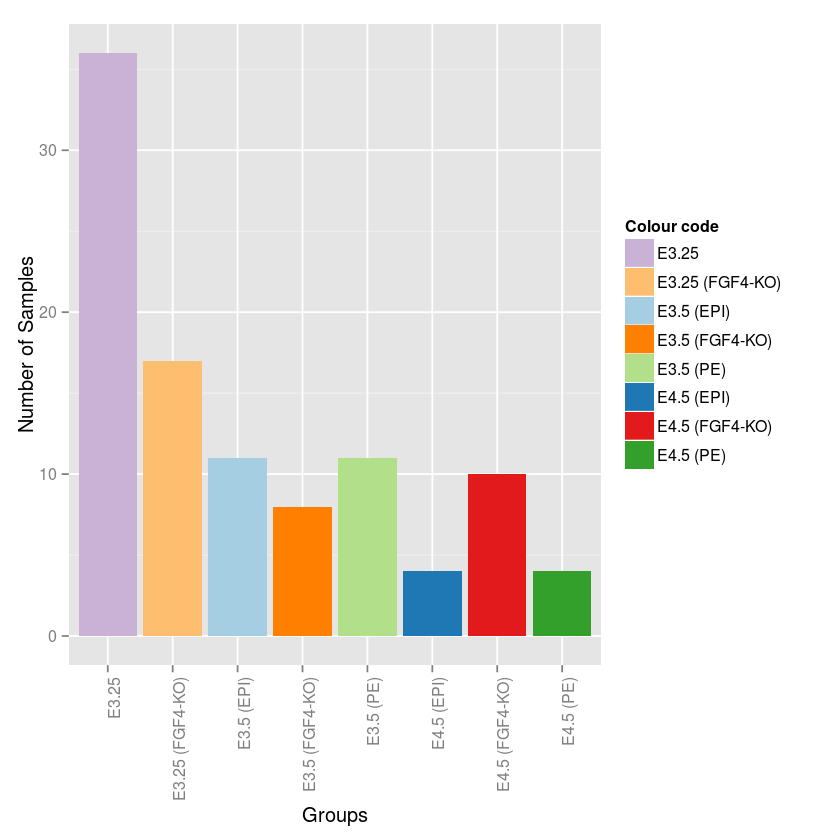

In [15]:
library("Hiiragi2013");
library("ggplot2")
library("mouse4302.db")
data("x")
print(dim(exprs(x)))
print(head(pData(x), 1))
groupSize <- table(x$sampleGroup) 
print(groupSize)
groupColour <- vapply(split(x$sampleColour, x$sampleGroup), 
                      FUN = unique, FUN.VALUE = "")
print(groupColour)
qplot(x = names(groupSize),
            y = as.vector(groupSize),
            geom = "bar", stat = "identity",
            xlab = "Groups", ylab = "Number of Samples",
            fill = names(groupSize)) + 
        scale_fill_manual(values = groupColour, name="Colour code") +
        theme(axis.text.x = element_text(angle = 90, hjust = 1))

Is there any way to suppress that console information? Or at least make it less verbose? ggplot2 seems to work. let's try a more complicated graphic:

ERROR: Error in .normargSeqlengths(value, seqnames(x)): supplied 'seqlengths' must be a vector


ERROR: Error in lengths(ideoCyto$hg19): 'x' must be a list or atomic vector


chr1  chr2  chr3  chr4  chr5  chr6  chr7  chr8  chr9 chr10 chr11 chr12 chr13 
   NA    NA    NA    NA    NA    NA    NA    NA    NA    NA    NA    NA    NA 
chr14 chr15 chr16 chr17 chr18 chr19 chr20 chr21 chr22  chrX 
   NA    NA    NA    NA    NA    NA    NA    NA    NA    NA

Warning message:
In getIdeoGR(data): geom(ideogram) need valid seqlengths information for accurate mapping,
                 now use reduced information as ideogram... Warning message:
In getIdeoGR(data): geom(ideogram) need valid seqlengths information for accurate mapping,
                 now use reduced information as ideogram... Scale for 'x' is already present. Adding another scale for 'x', which will replace the existing scale.
Scale for 'x' is already present. Adding another scale for 'x', which will replace the existing scale.


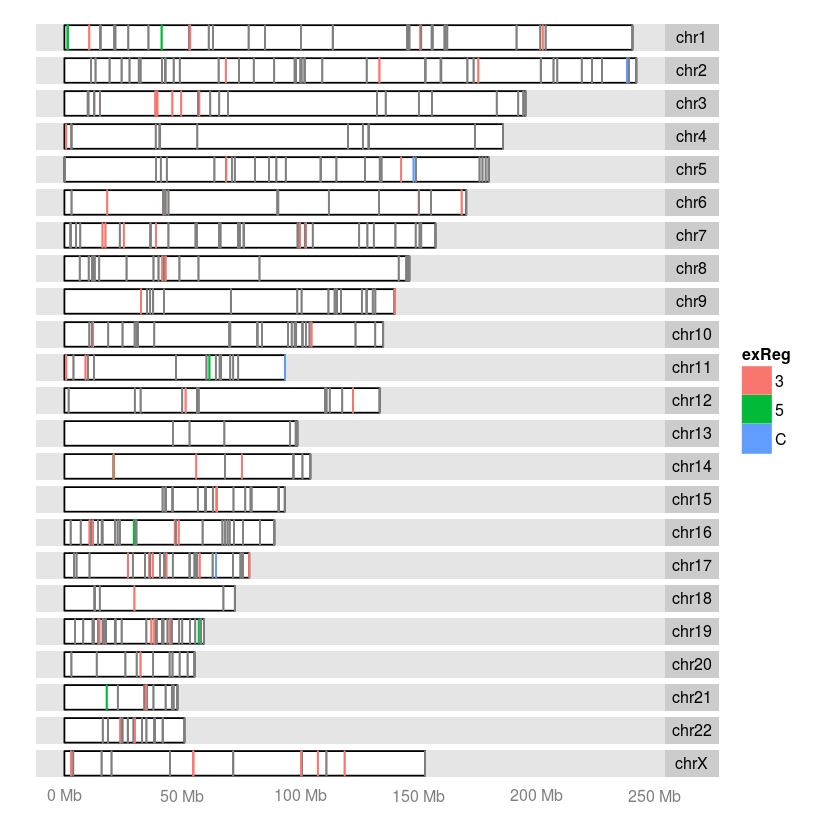

In [16]:
data(ideoCyto, package = "biovizBase")
data(darned_hg19_subset500, package = "biovizBase")
dn <- darned_hg19_subset500
library(GenomicRanges)
library(ggbio);
## add seqlengths
## we have seqlegnths information in another data set
seqlengths(dn) <- seq
lengths(ideoCyto$hg19)[names(seqlengths(dn))];
## then we change order
dn <- keepSeqlevels(dn, paste0("chr", c(1:22, "X")))
seqlengths(dn)
# print(autoplot(dn, layout = "karyogram"))
autoplot(dn, layout = "karyogram", aes(color = exReg, fill = exReg))

So ggbio and ggplot derivatives in general seem to be working quite well. 

Emphasis aka italics, with *asterisks* or _underscores_. Strong emphasis, aka bold, with **asterisks** or __underscores__.

Combined emphasis with **asterisks and _underscores_**.

| Tables        | Are           | Cool  |
| ------------- |---------------|-------|
| col 3 is      | right-aligned | \$1600|
| col 2 is      | centered      |  \$12 |
| zebra stripes | are neat      |   \$1 |

The outer pipes (|) are optional, and you don't need to make the raw Markdown line up prettily. You can also use inline Markdown.

Markdown | Less | Pretty
--- | --- | ---
*Still* | `renders` | **nicely**
1 | 2 | 3

1. First ordered list item
2. Another item
⋅⋅* Unordered sub-list. 
1. Actual numbers don't matter, just that it's a number
⋅⋅1. Ordered sub-list
4. And another item.

⋅⋅⋅You can have properly indented paragraphs within list items. Notice the blank line above, and the leading spaces (at least one, but we'll use three here to also align the raw Markdown).

⋅⋅⋅To have a line break without a paragraph, you will need to use two trailing spaces.⋅⋅
⋅⋅⋅Note that this line is separate, but within the same paragraph.⋅⋅
⋅⋅⋅(This is contrary to the typical GFM line break behaviour, where trailing spaces are not required.)

* Unordered list can use asterisks
- Or minuses
+ Or pluses

[I'm an inline-style link](https://www.google.com)

[I'm an inline-style link with title](https://www.google.com "Google's Homepage")

[I'm a reference-style link][Arbitrary case-insensitive reference text]

[I'm a relative reference to a repository file](../blob/master/LICENSE)

[You can use numbers for reference-style link definitions][1]

Or leave it empty and use the [link text itself]

Some text to show that the reference links can follow later.

[arbitrary case-insensitive reference text]: https://www.mozilla.org
[1]: http://slashdot.org
[link text itself]: http://www.reddit.com

In [17]:
library(mvtnorm) # for rmvnorm() in metrop()

Next define this huge function:

In [18]:
metrop <- function(func, thetaInit, Nburnin, Nsamp, sampleCov, verbose, demo=FALSE, ...) {

  Ntheta   <- length(thetaInit)
  thetaCur <- thetaInit
  funcCur  <- func(thetaInit, ...) # log10
  funcSamp <- matrix(data=NA, nrow=Nsamp, ncol=2+Ntheta) # this will be filled and returned
  nAccept  <- 0
  acceptRate <- 0
  if(demo) {
    thetaPropAll <- matrix(data=NA, nrow=Nsamp, ncol=Ntheta)
  }
  
  for(n in 1:(Nburnin+Nsamp)) {

    # Metropolis algorithm. No Hastings factor for symmetric sampling distributions.
    if(is.null(dim(sampleCov))) { # theta and sampleCov are scalars
      thetaProp <- rnorm(n=1, mean=thetaCur, sd=sqrt(sampleCov))
    } else {
      thetaProp <- rmvnorm(n=1, mean=thetaCur, sigma=sampleCov, method="eigen")
    }
    funcProp  <- func(thetaProp, ...) 
    logMR <- sum(funcProp) - sum(funcCur) # log10 of the Metropolis ratio
    # cat(n, thetaProp, funcProp, funcCur, "\n")
    if(logMR>=0 || logMR>log10(runif(1, min=0, max=1))) {
      thetaCur   <- thetaProp
      funcCur    <- funcProp
      nAccept    <- nAccept + 1
      acceptRate <- nAccept/n
    }
    if(n>Nburnin) {
      funcSamp[n-Nburnin,1:2] <- funcCur
      funcSamp[n-Nburnin,3:(2+Ntheta)] <- thetaCur
      if(demo) {
        thetaPropAll[n-Nburnin,1:Ntheta] <- thetaProp
      }
    }

    # diagnostics
    if( is.finite(verbose) && (n%%verbose==0 || n==Nburnin+Nsamp) ) {
      sdump1 <- noquote( formatC(n,          format="d", digits=5, flag="") )
      sdump2 <- noquote( formatC(Nburnin,    format="g", digits=5, flag="") )
      sdump3 <- noquote( formatC(Nsamp,      format="g", digits=5, flag="") )
      sdump4 <- noquote( formatC(acceptRate, format="f", width=7, digits=4, flag="") )
      cat(sdump1, "of", sdump2, "+", sdump3, sdump4, "\n")
    }

  }

  if(demo) {
    return(list(funcSamp=funcSamp, thetaPropAll=thetaPropAll))
  } else {
    return(funcSamp)
  }
 
}

Then define the function to create a covariance matrix:

In [19]:
make.covariance.matrix <- function(sampleSD, sampleCor) {
  Len <- length(sampleSD)
  covMatrix <- matrix(nrow=Len, ncol=Len)
  if(abs(sampleCor)>1) {stop("|sampleCor| > 1")}
  for(i in 1:(Len)) {
    for(j in 1:(Len)) {
      if(i==j) {
        covMatrix[i,j] <- sampleSD[i]^2
      } else {
        covMatrix[i,j] <- sampleCor*sampleSD[i]*sampleSD[j]
      }
    }
  }
  return(covMatrix)
}

Define the following parameters of the MCMC demo:

In [20]:
plotev    <- TRUE # do we want to plot the evolution?
delay     <-  0.5 # time delay in seconds between steps in evolution
thetaInit <- -5   # MCMC initialization
sampleSig <-  10  # MCMC step size
Nsamp     <-  50  # number of MCMC samples

In [21]:
# test function
testfunc <- function(theta) {
  return(dcauchy(theta, -10, 2) + 4*dcauchy(theta, 10, 4))
}
# interface to test function for metrop()
testfunc.metrop <- function(theta) {
  return(c(0,log10(testfunc(theta))))
}

Now plot the test function (which is simply the sum of 2 Cauchy distributions):

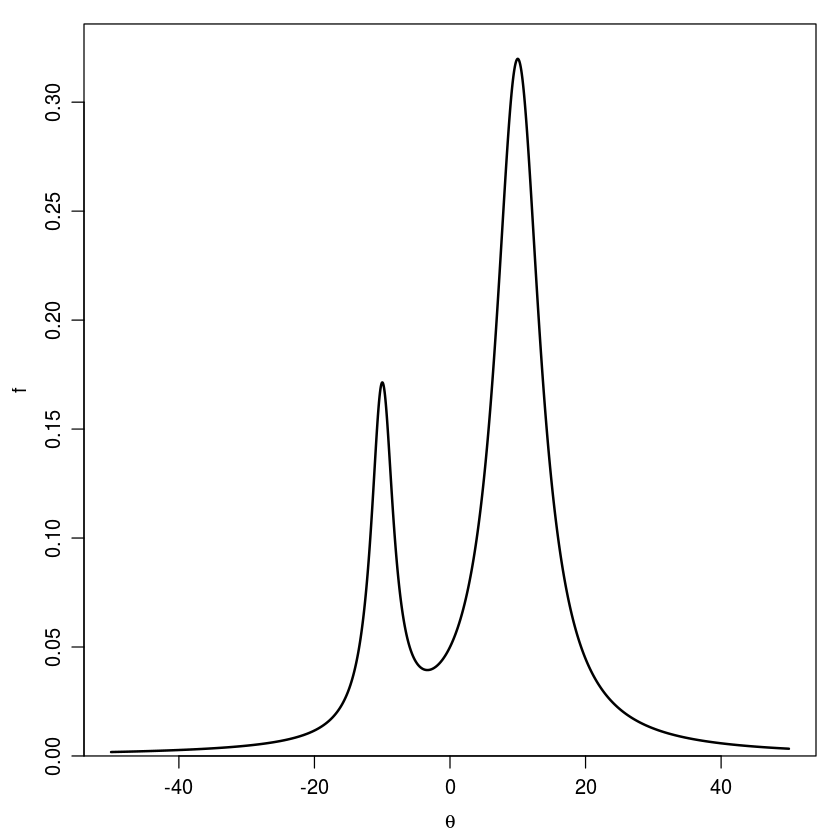

In [22]:
# Establish range, and plot test function
x <- seq(from=-50, to=50, length.out=1e4)
y <- testfunc(x)
ymax <- 1.05*max(y)
# compute normalization function: used later to put on same as histogram
Zfunc <- sum(y)*diff(range(x))/(length(x))
par(mfrow=c(1,1), mar=c(3.0,3.0,0.5,0.5), oma=c(0.5,0.5,0.5,0.5), mgp=c(2.2,0.8,0), cex=1.0)
plot(x, y, type="l", yaxs="i", lwd=2, ylim=c(0, ymax), xlab=expression(theta), ylab="f")

Plot the evolution of the MCMC demo:

   1 Proposal:  -10.75  =>  Current:  -10.75 ACCEPTED


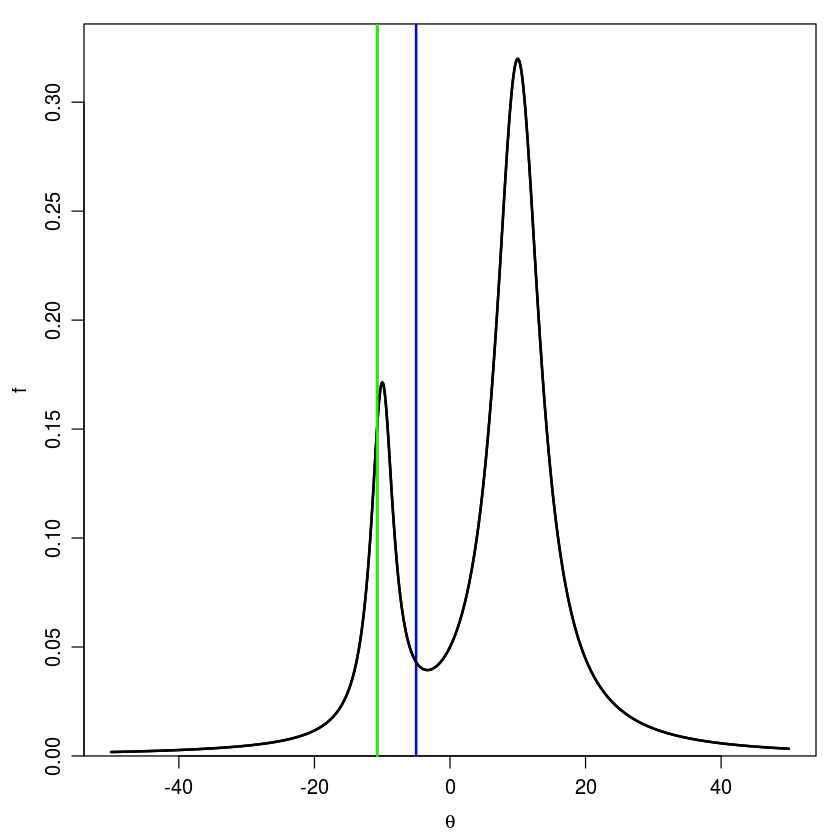

   2 Proposal:   -4.83  =>  Current:  -10.75


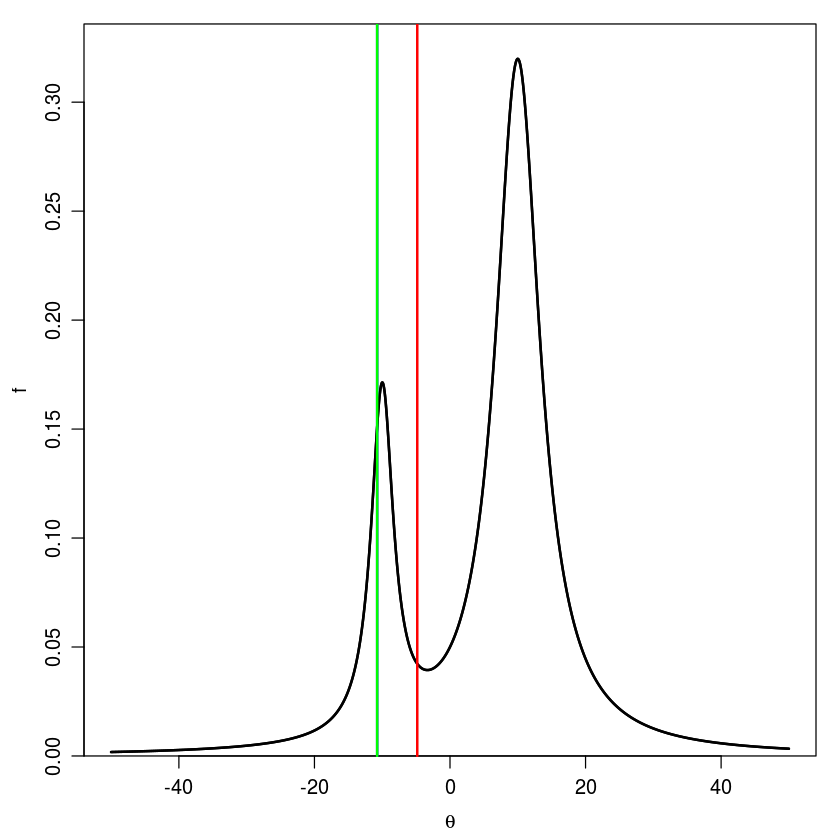

   3 Proposal:  -26.35  =>  Current:  -10.75


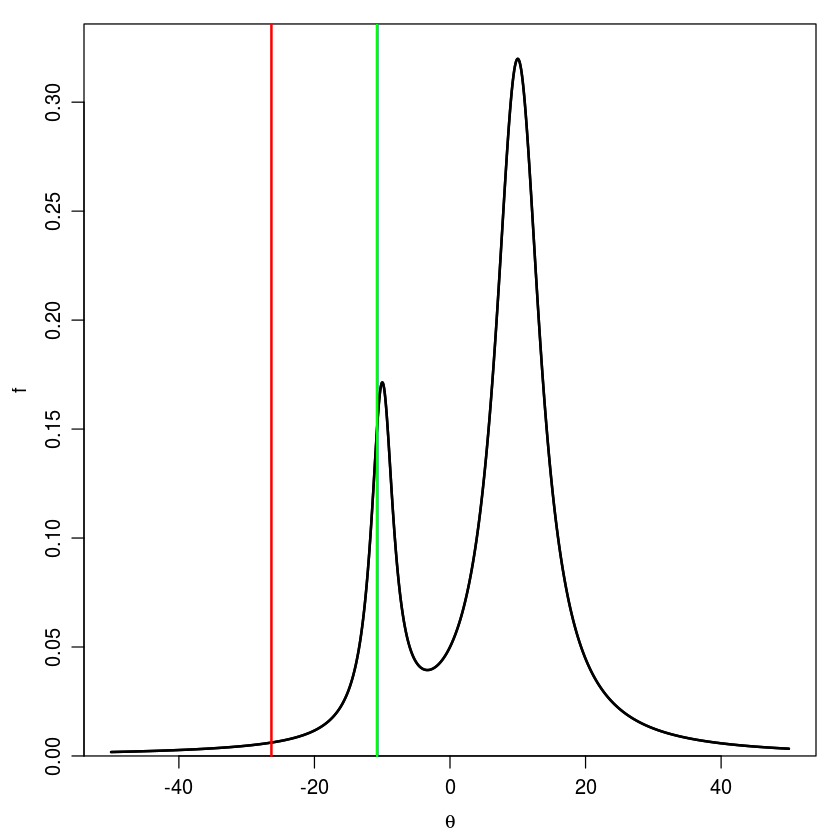

   4 Proposal:   -7.12  =>  Current:  -10.75


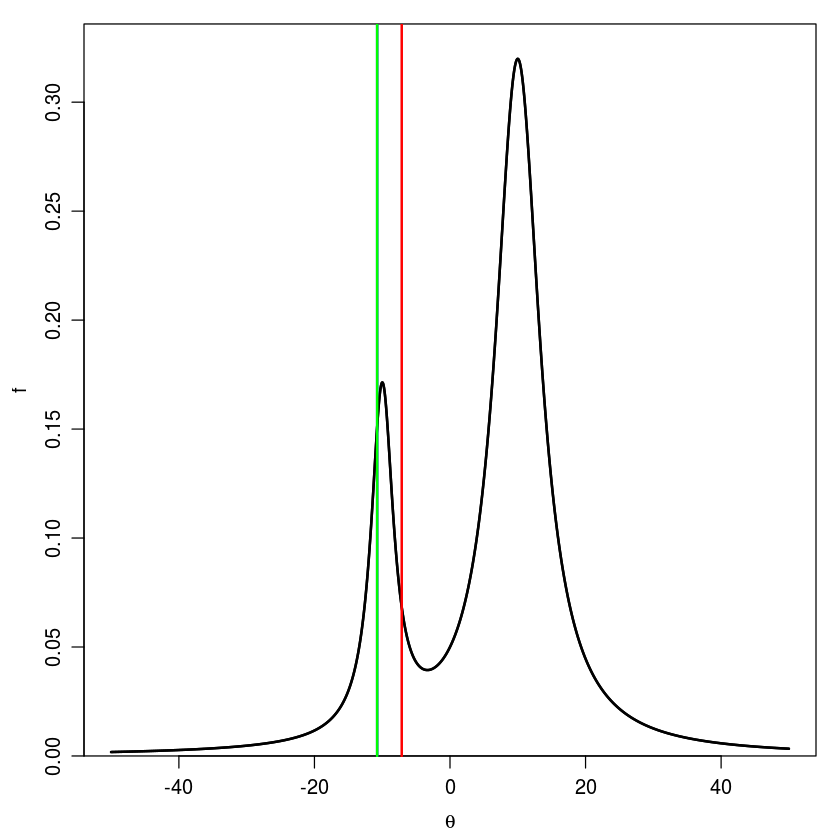

   5 Proposal:  -19.10  =>  Current:  -10.75


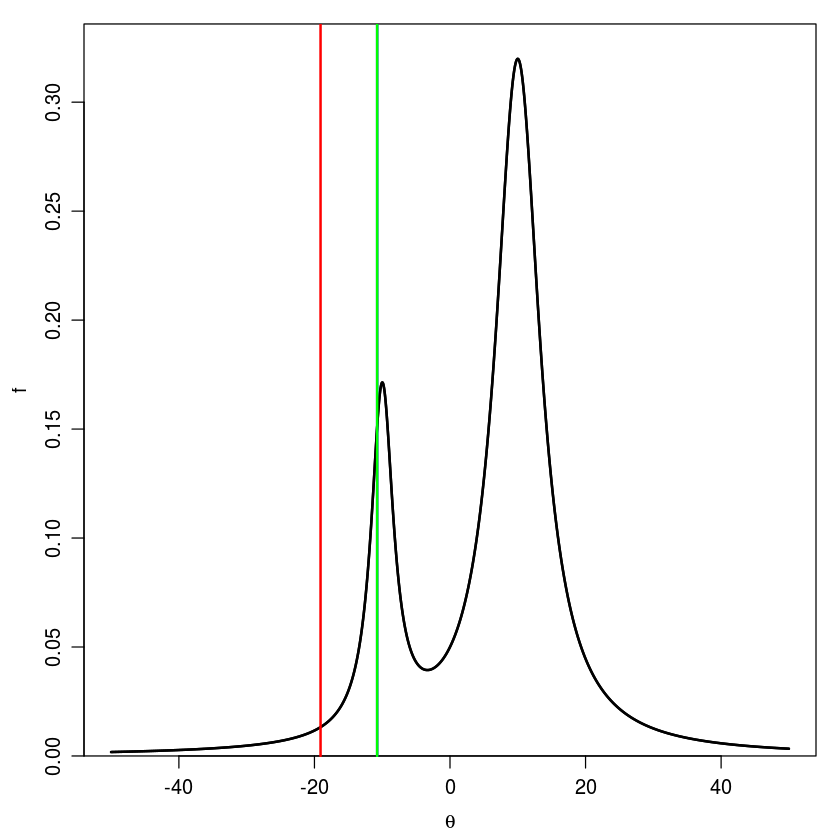

   6 Proposal:   -5.89  =>  Current:   -5.89 ACCEPTED


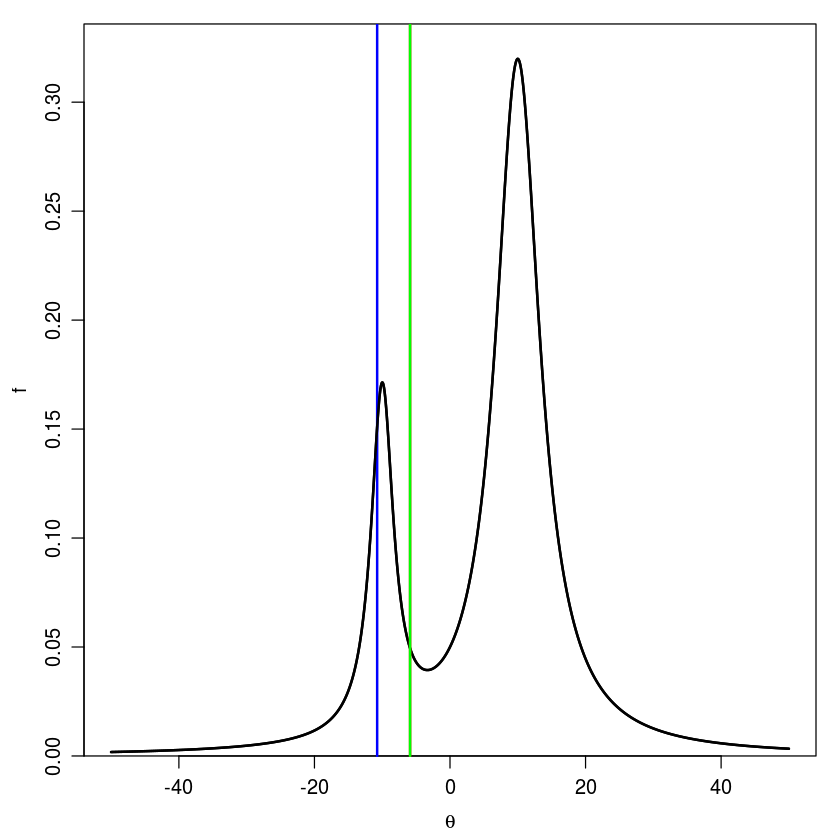

   7 Proposal:   -7.00  =>  Current:   -7.00 ACCEPTED


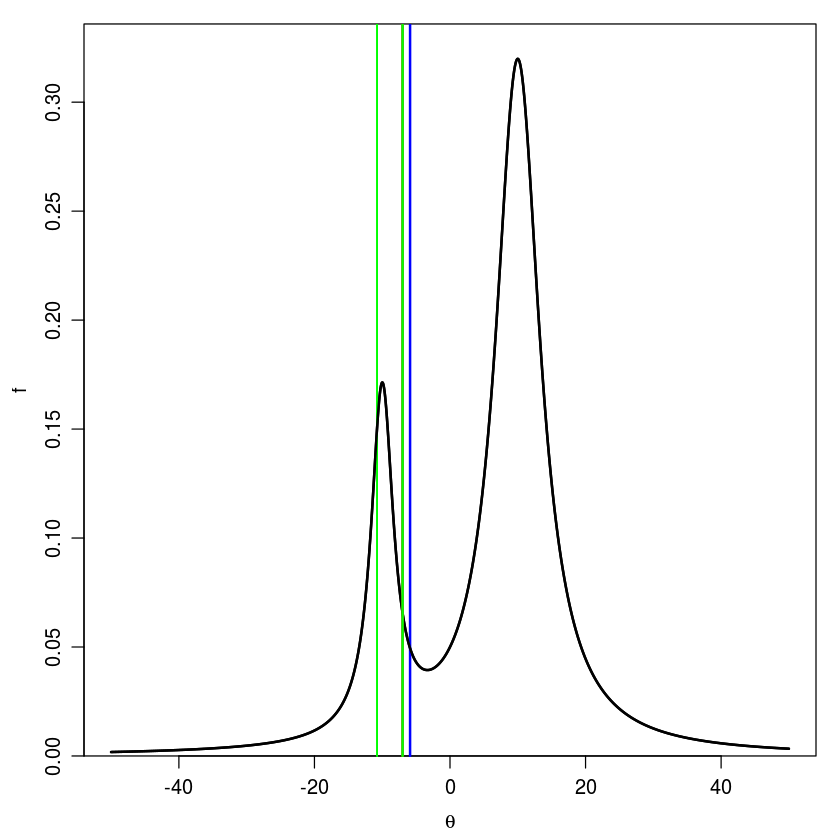

   8 Proposal:  -29.82  =>  Current:   -7.00


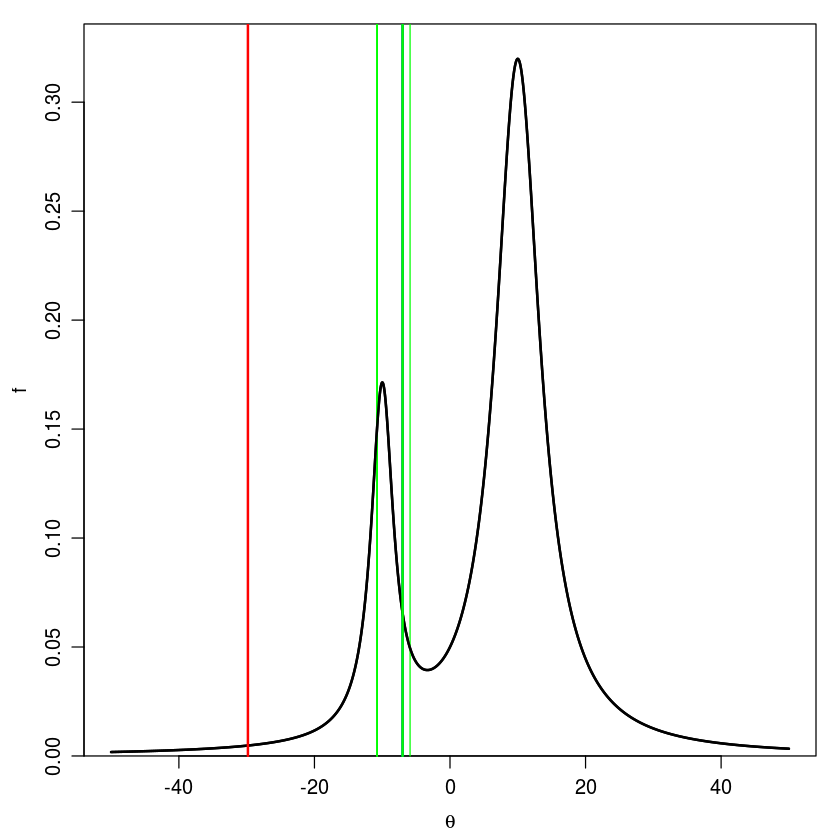

   9 Proposal:   -9.80  =>  Current:   -9.80 ACCEPTED


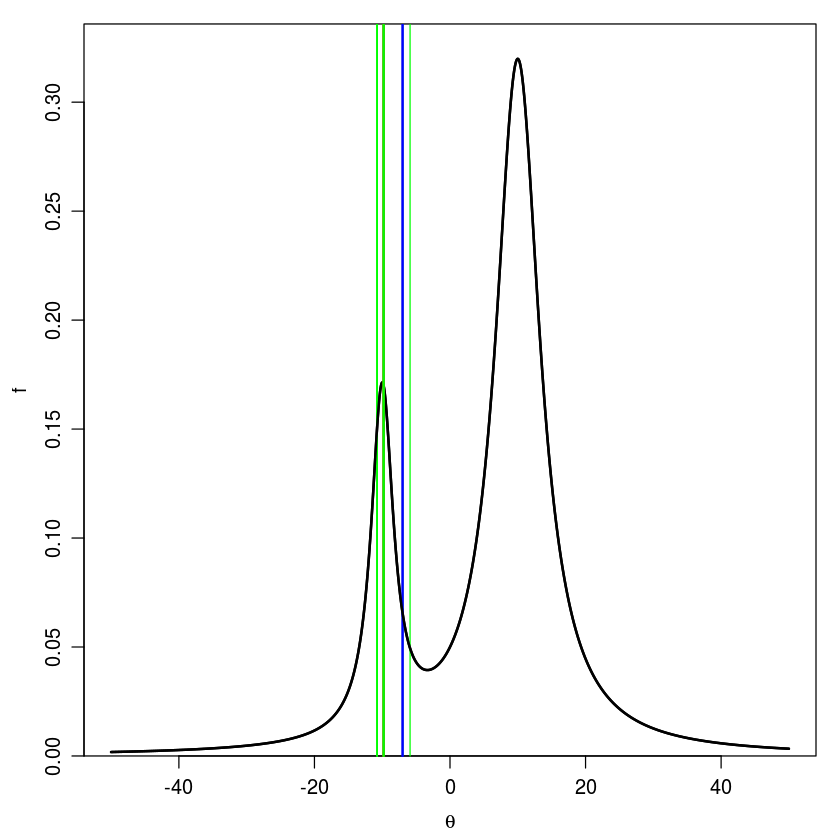

  10 Proposal:  -12.14  =>  Current:   -9.80


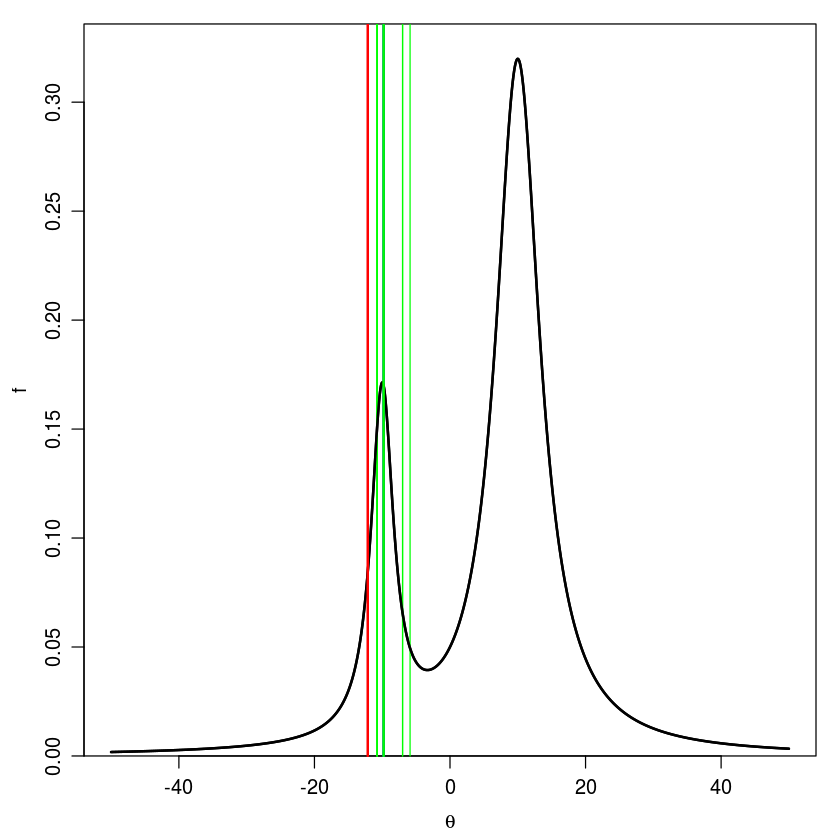

  11 Proposal:  -11.12  =>  Current:  -11.12 ACCEPTED


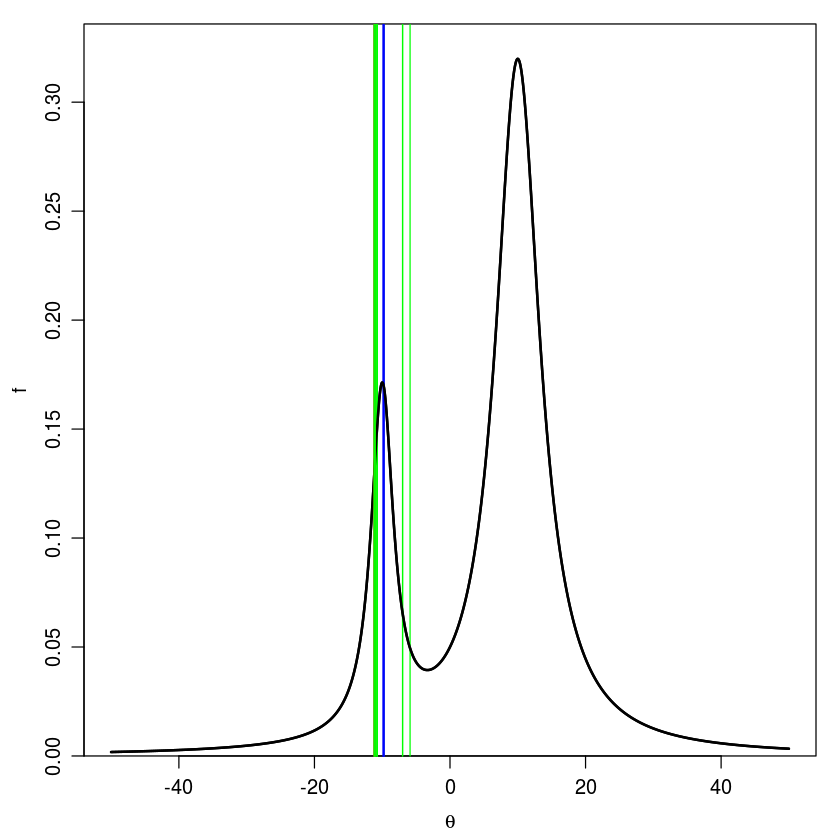

  12 Proposal:    1.84  =>  Current:  -11.12


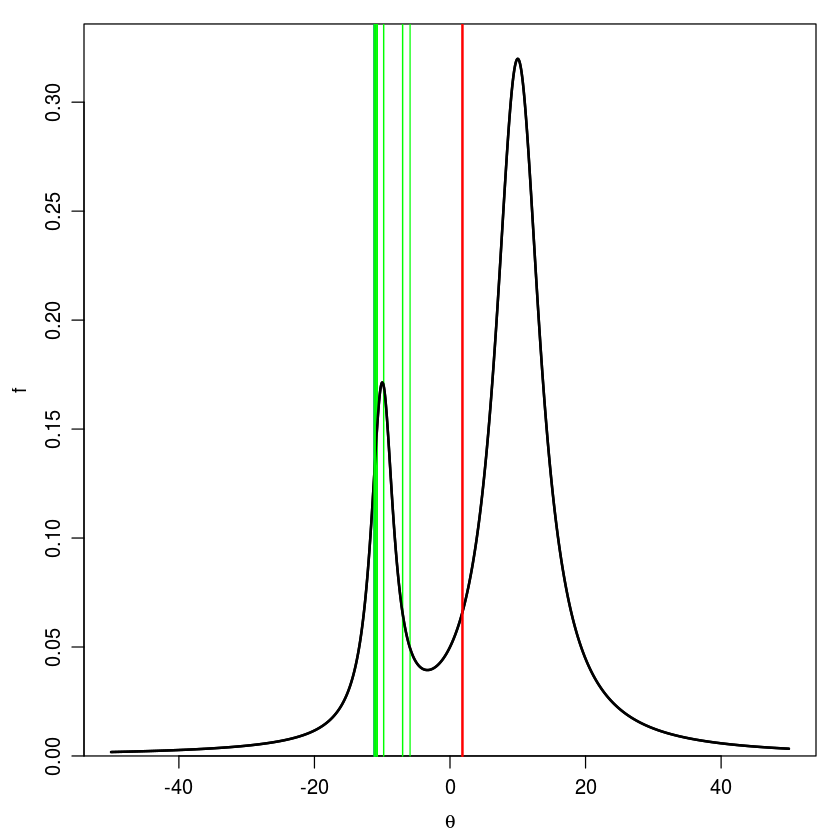

  13 Proposal:    1.87  =>  Current:    1.87 ACCEPTED


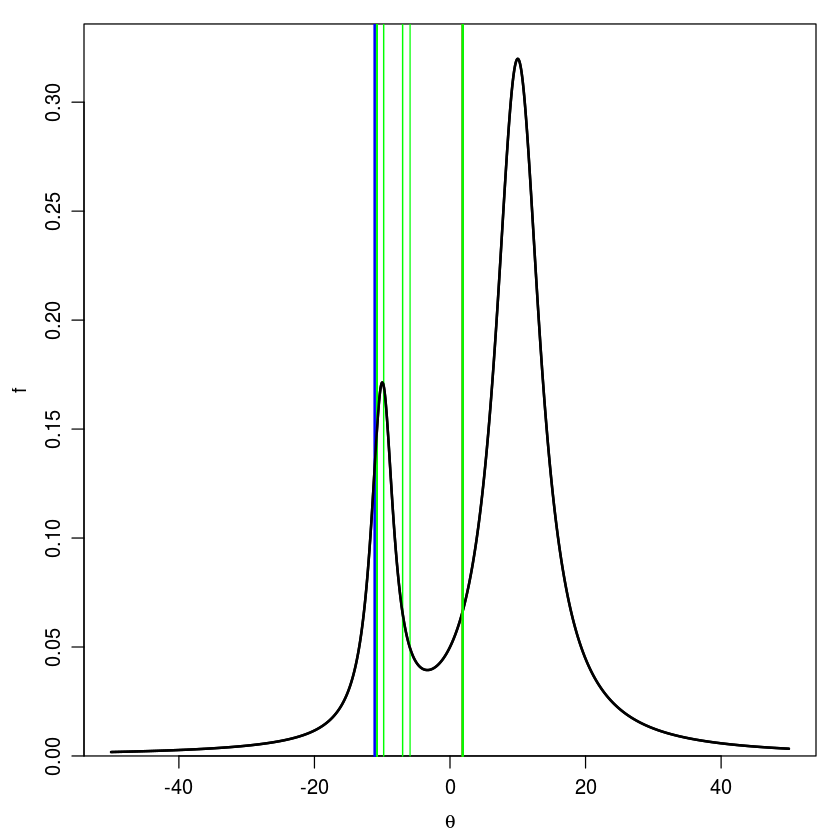

  14 Proposal:   -2.71  =>  Current:   -2.71 ACCEPTED


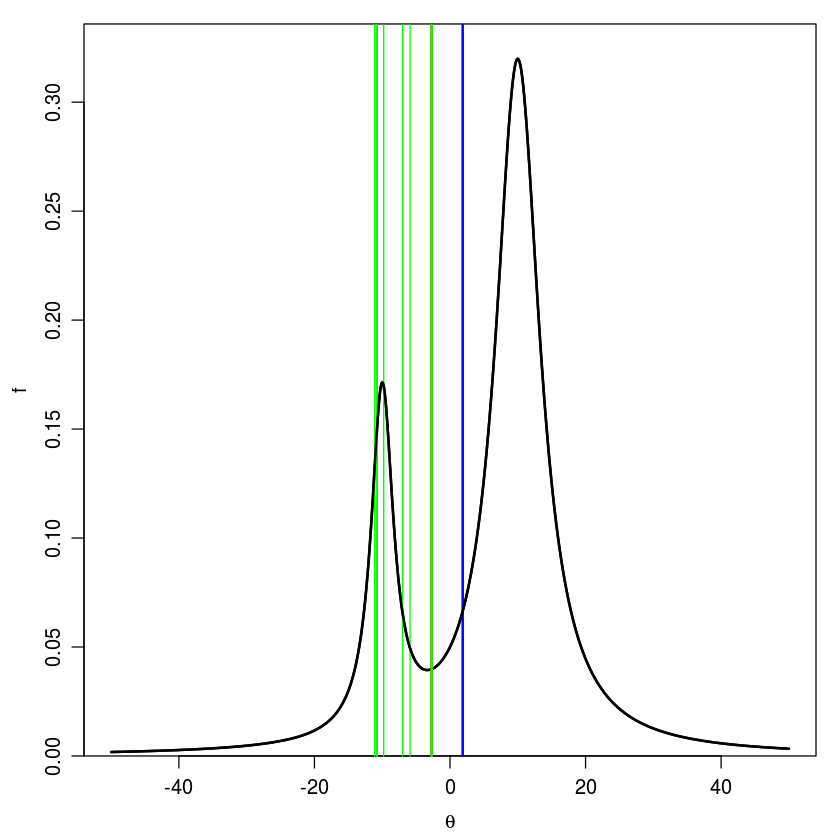

  15 Proposal:   -8.65  =>  Current:   -8.65 ACCEPTED


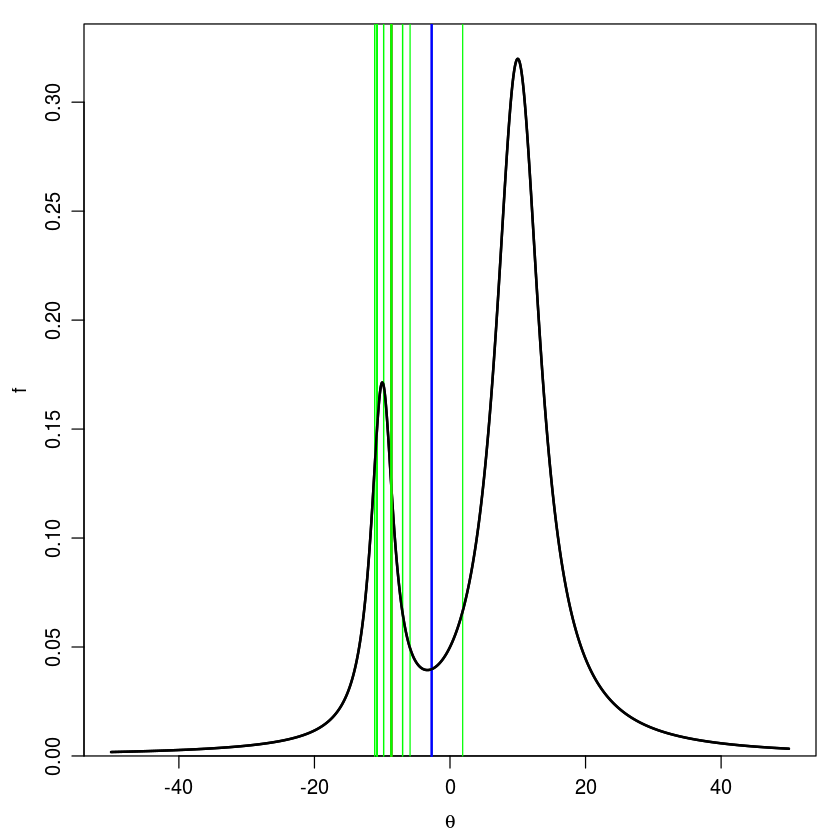

  16 Proposal:   -1.37  =>  Current:   -8.65


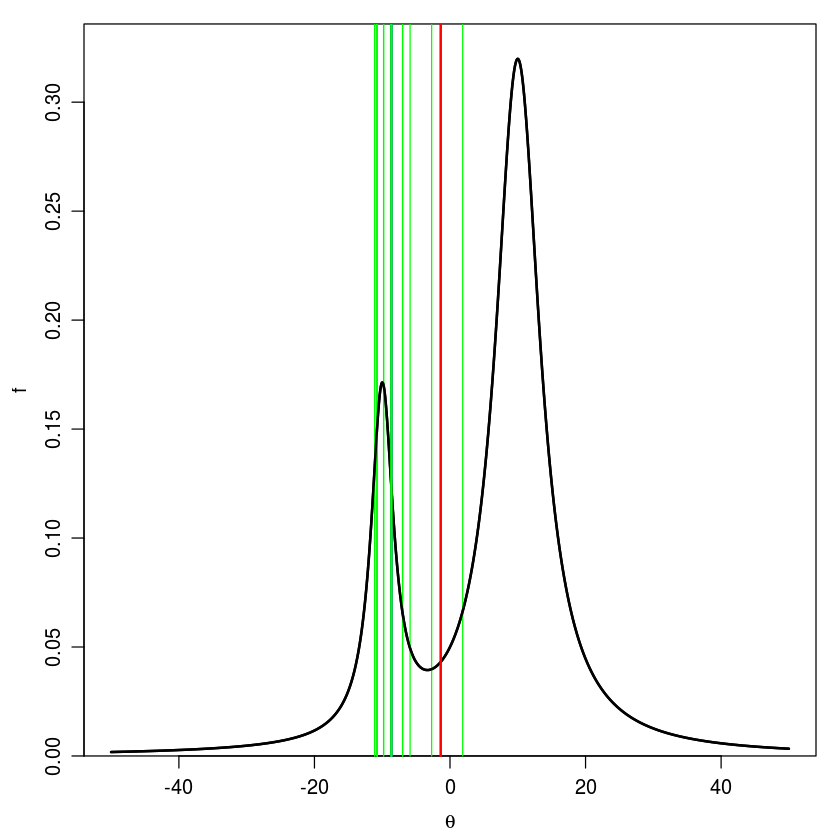

  17 Proposal:  -13.99  =>  Current:  -13.99 ACCEPTED


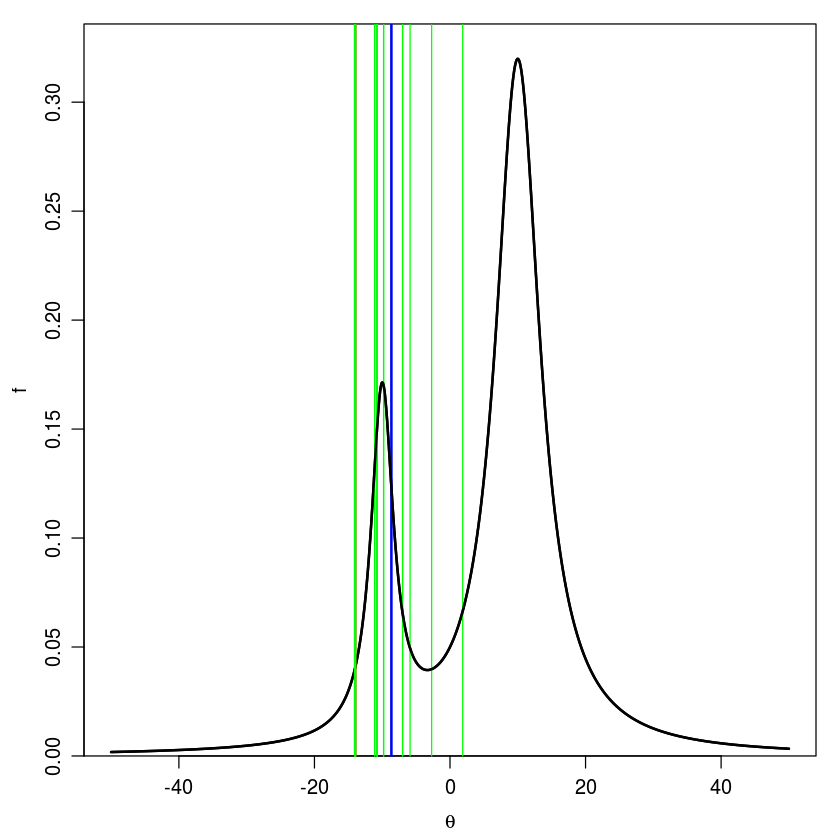

  18 Proposal:  -15.71  =>  Current:  -13.99


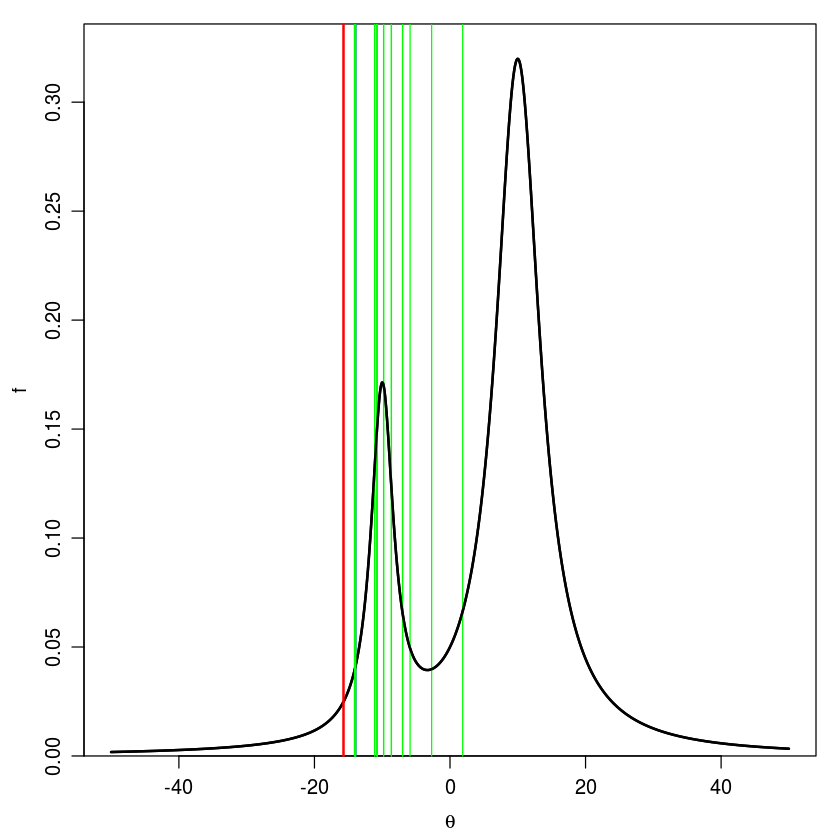

  19 Proposal:   -6.11  =>  Current:   -6.11 ACCEPTED


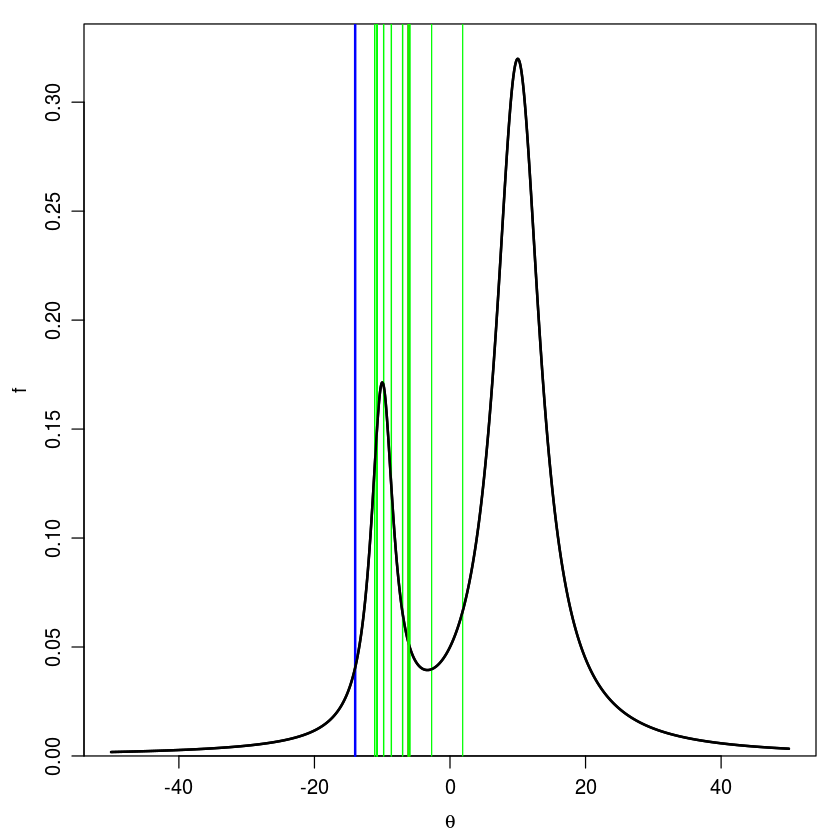

  20 Proposal:  -20.00  =>  Current:   -6.11


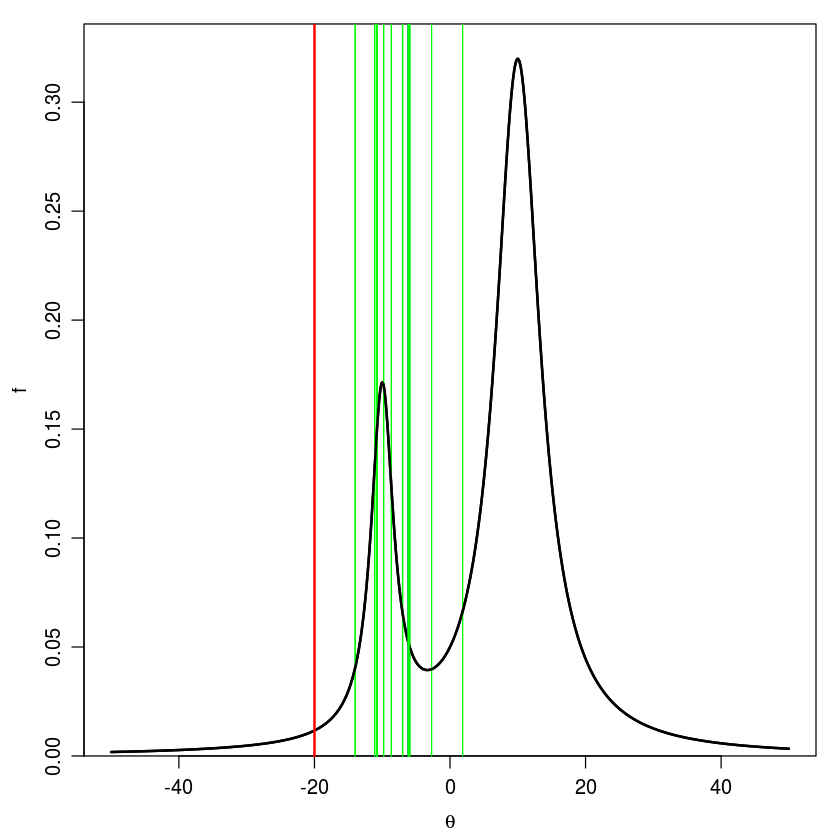

  21 Proposal:  -14.03  =>  Current:   -6.11


In [ ]:
# Run MCMC
chain <- metrop(func=testfunc.metrop, thetaInit=thetaInit, Nburnin=0, Nsamp=Nsamp, 
                 sampleCov=sampleSig^2, verbose=Inf, demo=TRUE)

# Plot evolution of chain
if(plotev) {
  par(mfrow=c(1,1), mar=c(3.0,3.0,0.5,0.5), oma=c(0.5,0.5,0.5,0.5), mgp=c(2.2,0.8,0), cex=1.0)
  for(i in 1:nrow(chain$thetaPropAll)) {
    plot(x, y, type="l", yaxs="i", lwd=2, ylim=c(0, ymax), xlab=expression(theta), ylab="f")
    if(i==1) {
      segments(thetaInit, 0, thetaInit, 1, col="blue", lwd=2)
      Sys.sleep(delay)
    } else { 
      segments(chain$funcSamp[1:(i-1),3], 0, chain$funcSamp[1:(i-1),3], ymax, col="green")
      segments(chain$funcSamp[i-1,3], 0, chain$funcSamp[i-1,3], ymax, col="blue", lwd=2)
    }
    lines(x, y, lwd=2) # replot to bring to front
    segments(chain$thetaPropAll[i,1], 0, chain$thetaPropAll[i,1], ymax, col="red", lwd=2)
    cat(formatC(i, digits=3), "Proposal: ", formatC(chain$thetaPropAll[i,1], digits=2, width=6, format="f"))
    Sys.sleep(delay)
    segments(chain$funcSamp[i,3], 0, chain$funcSamp[i,3], ymax, col="green", lwd=2)
    cat("  =>  Current: ", formatC(chain$funcSamp[i,3], digits=2, width=6, format="f"), append=TRUE)
    if(chain$funcSamp[i,3]==chain$thetaPropAll[i,1]) {
      cat(" ACCEPTED")
    }
    cat("\n")
    Sys.sleep(delay)
  }
}